In [1]:
!cp -r ../input/maskrcnn-keras-source-code/MaskRCNN/* ./

In [2]:
pip install mrcnn


     |████████████████████████████████| 61kB 340kB/s eta 0:00:011
  Stored in directory: /root/.cache/pip/wheels/11/ed/28/e550ddc897c04c336b923eae4eb35c9aae993d20ce39d9cc40
Successfully built mrcnn
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np 
import pandas as pd 
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import sys, os, random, glob, cv2, math

from mrcnn import utils
from mrcnn.model import log
from mrcnn import visualize
import mrcnn.model as modellib
from mrcnn.config import Config

Using TensorFlow backend.


In [4]:
def seed_all(SEED):
    random.seed(SEED)
    np.random.seed(SEED)
    os.environ['PYTHONHASHSEED'] = str(SEED)

seed_all(42)
sns.set(style="darkgrid")
%matplotlib inline

In [5]:
ORIG_SIZE     = 1024
epoch         = 100
data_root     = '/kaggle/input'
packages_root = '/kaggle/working'

In [6]:
df = pd.read_csv(os.path.join(data_root , 'global-wheat-detection/train.csv'))
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
image_id    147793 non-null object
width       147793 non-null int64
height      147793 non-null int64
bbox        147793 non-null object
source      147793 non-null object
dtypes: int64(2), object(3)
memory usage: 5.6+ MB


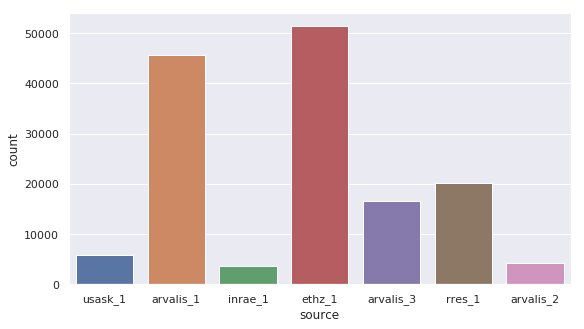

In [8]:
plt.figure(figsize=(9,5))
sns.countplot(df.source)
plt.show()

In [9]:
img_root = '../input/global-wheat-detection/train/'
len(os.listdir(img_root)) - len(df.image_id.unique())

49

In [10]:
df['bbox'] = df['bbox'].apply(lambda x: x[1:-1].split(","))

df['x'] = df['bbox'].apply(lambda x: x[0]).astype('float32')
df['y'] = df['bbox'].apply(lambda x: x[1]).astype('float32')
df['w'] = df['bbox'].apply(lambda x: x[2]).astype('float32')
df['h'] = df['bbox'].apply(lambda x: x[3]).astype('float32')

df = df[['image_id','x', 'y', 'w', 'h']]
df.head()

,image_id,x,y,w,h
0,b6ab77fd7,834.0,222.0,56.0,36.0
1,b6ab77fd7,226.0,548.0,130.0,58.0
2,b6ab77fd7,377.0,504.0,74.0,160.0
3,b6ab77fd7,834.0,95.0,109.0,107.0
4,b6ab77fd7,26.0,144.0,124.0,117.0


In [11]:
class WheatDetectorConfig(Config): 
    NAME = 'wheat'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    BACKBONE = 'resnet101'
    
    NUM_CLASSES = 2
    
    IMAGE_RESIZE_MODE = "square"
    IMAGE_MIN_DIM = 1024
    IMAGE_MAX_DIM = 1024
    
    STEPS_PER_EPOCH = 120
    
    RPN_ANCHOR_SCALES = (16, 32, 64, 128)
    
    LEARNING_RATE = 0.005
    WEIGHT_DECAY  = 0.0005
    
    TRAIN_ROIS_PER_IMAGE = 350 
    
    DETECTION_MIN_CONFIDENCE = 0.60
    
    VALIDATION_STEPS = 60
    
    MAX_GT_INSTANCES = 500 # 200 
 
    LOSS_WEIGHTS = {
        "rpn_class_loss": 1.0,
        "rpn_bbox_loss": 1.0,
        "mrcnn_class_loss": 1.0,
        "mrcnn_bbox_loss": 1.0,
        "mrcnn_mask_loss": 1.0
        }

config = WheatDetectorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.6
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.005
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE        

In [12]:
def get_jpg(img_dir, anns):
    id      = []
    jpg_fps = []

    for index, row in anns.iterrows():
        id.append(row['image_id'])

    for i in os.listdir(img_dir):
        if os.path.splitext(i)[0] not in id:
            continue
        else:
            jpg_fps.append(os.path.join(img_dir, i))

    return list(set(jpg_fps))

def get_dataset(img_dir, anns): 
    image_fps = get_jpg(img_dir, anns)

    image_annotations = {fp: [] for fp in image_fps}

    for index, row in anns.iterrows(): 
        fp = os.path.join(img_dir, row['image_id'] + '.jpg')
        image_annotations[fp].append(row)

    return image_fps, image_annotations 

In [13]:
class DetectorDataset(utils.Dataset):
    def __init__(self, image_fps, image_annotations, orig_height, orig_width):
        super().__init__(self)
        
        self.add_class('GlobalWheat', 1 , 'Wheat') # only one class, wheat
        
        for id, fp in enumerate(image_fps):
            annotations = image_annotations[fp]
            self.add_image('GlobalWheat', image_id=id, 
                           path=fp, annotations=annotations, 
                           orig_height=orig_height, orig_width=orig_width)
       
    def load_mask(self, image_id):
        info = self.image_info[image_id]
        annotations = info['annotations']
        count = len(annotations)
    
        if count == 0:
            mask = np.zeros((info['orig_height'], info['orig_width'], 1), 
                            dtype=np.uint8)
            class_ids = np.zeros((1,), dtype=np.int32)
        else:
            mask = np.zeros((info['orig_height'], info['orig_width'], count),
                            dtype=np.uint8)
            class_ids = np.zeros((count,), dtype=np.int32)
            for i, a in enumerate(annotations):
                x = int(a['x'])
                y = int(a['y'])
                w = int(a['w'])
                h = int(a['h'])
                mask_instance = mask[:, :, i].copy()
                cv2.rectangle(mask_instance, (x, y), (x+w, y+h), 255, -1)
                mask[:, :, i] = mask_instance
                class_ids[i] = 1
        return mask.astype(np.bool), class_ids.astype(np.int32)
     
    def load_image(self, image_id):
        info = self.image_info[image_id]
        fp = info['path']
        image = cv2.imread(fp, cv2.IMREAD_COLOR)
        
        if len(image.shape) != 3 or image.shape[2] != 3:
            image = np.stack((image,) * 3, -1)
        return image
    
    
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

In [14]:
image_ids = df['image_id'].unique()

valid_ids = image_ids[-700:]
train_ids = image_ids[:-700]

valid_df = df[df['image_id'].isin(valid_ids)]
train_df = df[df['image_id'].isin(train_ids)]
train_df.shape, valid_df.shape

((122106, 5), (25687, 5))

In [15]:
len(train_df.image_id.unique()), len(valid_df.image_id.unique())

(2673, 700)

In [16]:

train_image_fps, train_image_annotations = get_dataset(img_root,
                                                       anns=train_df)


dataset_train = DetectorDataset(train_image_fps, 
                                train_image_annotations,
                                ORIG_SIZE, ORIG_SIZE)
dataset_train.prepare()

print("Class Count: {}".format(dataset_train.num_classes))
for i, info in enumerate(dataset_train.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Class Count: 2
  0. BG                                                
  1. Wheat                                             


In [17]:

valid_image_fps, valid_image_annotations = get_dataset(img_root, 
                                           anns=valid_df)


dataset_valid = DetectorDataset(valid_image_fps, valid_image_annotations,
                                ORIG_SIZE, ORIG_SIZE)
dataset_valid.prepare()

print("Class Count: {}".format(dataset_valid.num_classes))
for i, info in enumerate(dataset_valid.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Class Count: 2
  0. BG                                                
  1. Wheat                                             


(1024, 1024, 3)
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


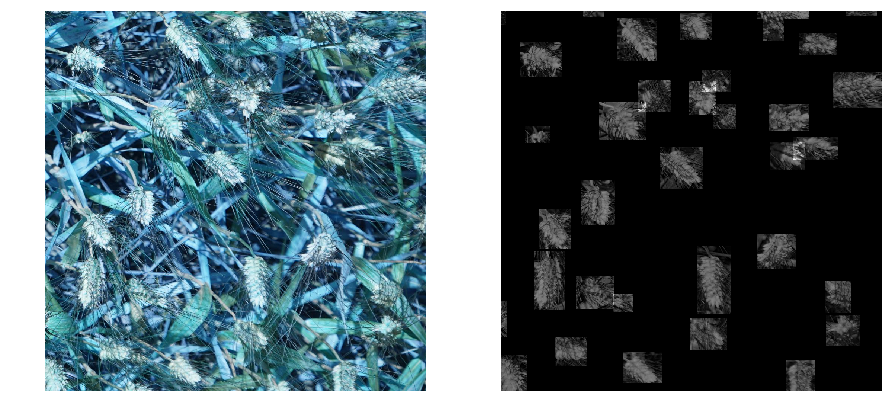

In [18]:
class_ids = [0]

while class_ids[0] == 0:  
    image_id = random.choice(dataset_train.image_ids)
    image_fp = dataset_train.image_reference(image_id)
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)

print(image.shape)

plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
masked = np.zeros(image.shape[:2])
for i in range(mask.shape[2]):
    masked += image[:, :, 0] * mask[:, :, i]
plt.imshow(masked, cmap='gray')
plt.axis('off')

print(class_ids)
plt.show()

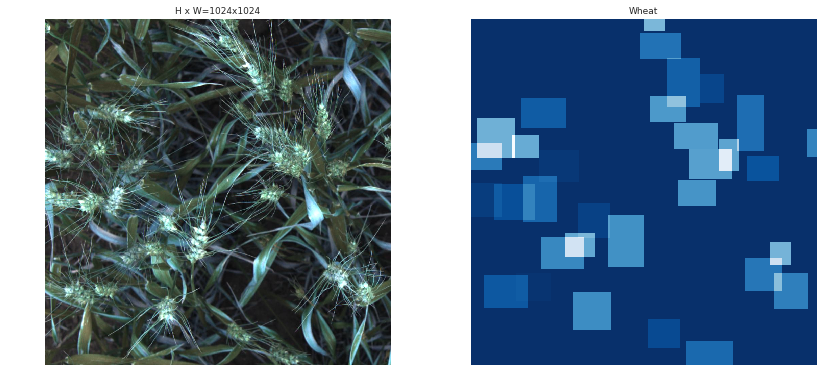

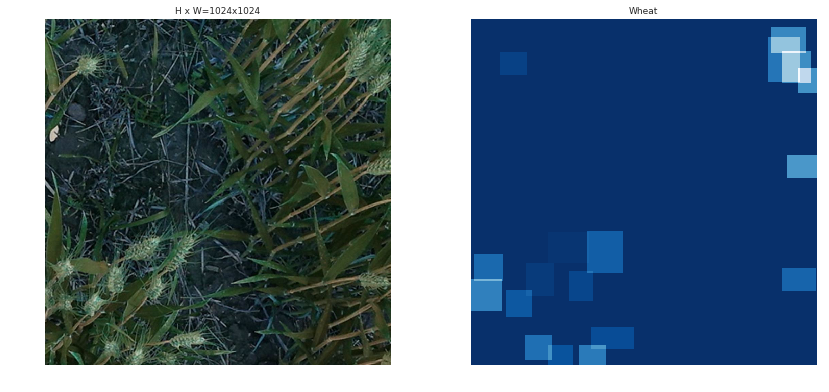

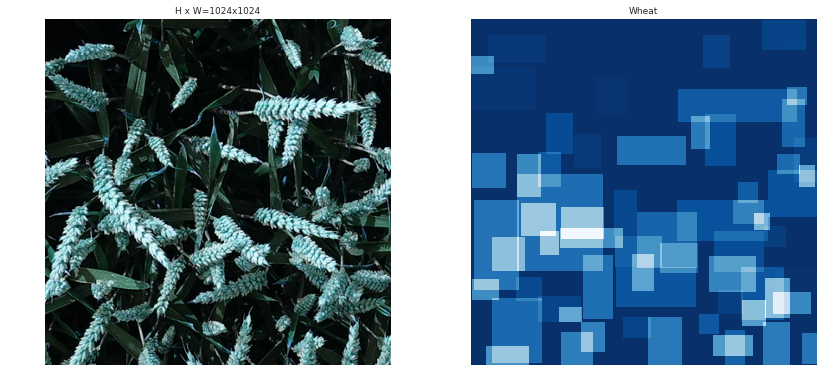

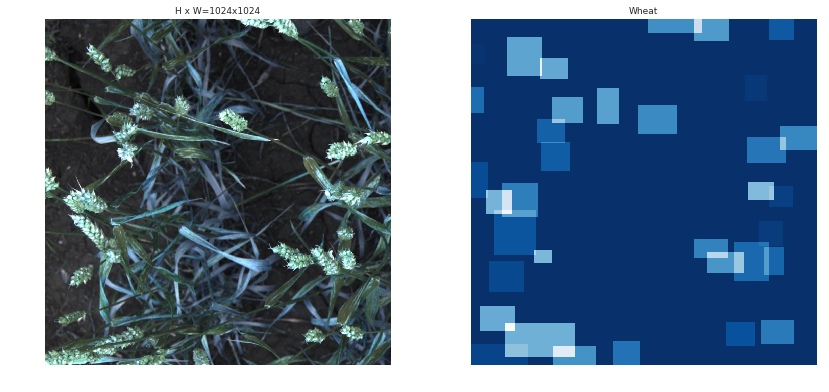

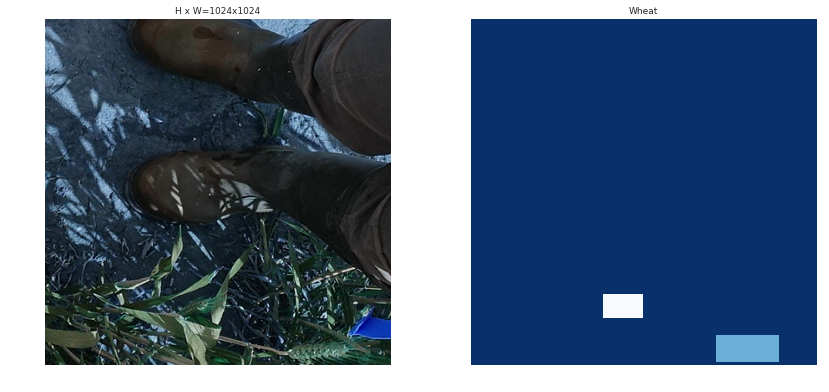

In [19]:

image_ids = np.random.choice(dataset_train.image_ids,5)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, 
                                dataset_train.class_names, limit=1)

Original shape:  (1024, 1024, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 34)      min:    0.00000  max:    1.00000  bool
class_ids                shape: (34,)                 min:    1.00000  max:    1.00000  int32
bbox                     shape: (34, 4)               min:    0.00000  max: 1024.00000  int32


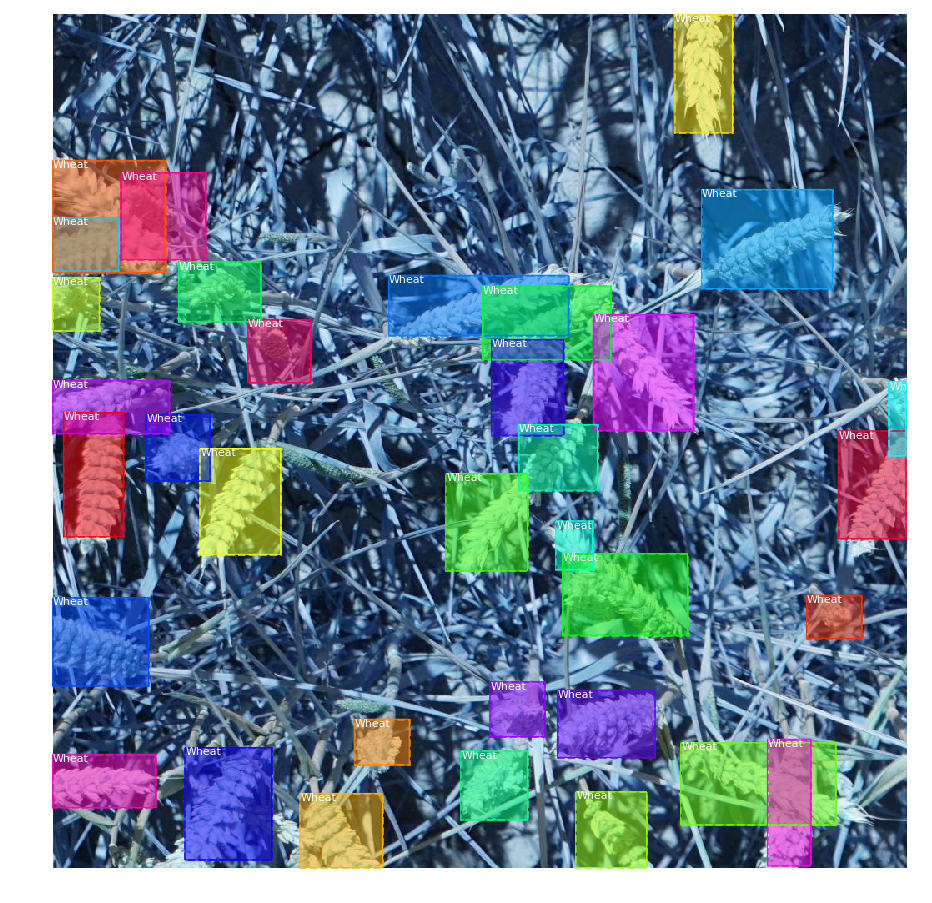

In [20]:

image_id = np.random.choice(dataset_train.image_ids, 1)[0]
image = dataset_train.load_image(image_id)
mask, class_ids = dataset_train.load_mask(image_id)
original_shape = image.shape

image, window, scale, padding, _ = utils.resize_image(image, 
                                                      min_dim=config.IMAGE_MIN_DIM, 
                                                      max_dim=config.IMAGE_MAX_DIM,
                                                      mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)


bbox = utils.extract_bboxes(mask)


print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)


visualize.display_instances(image, bbox, mask, class_ids, 
                            dataset_train.class_names)

In [21]:
!pip install ../input/img-aug-v04/imgaug-0.4.0-py2.py3-none-any.whl

Processing /kaggle/input/img-aug-v04/imgaug-0.4.0-py2.py3-none-any.whl
ERROR: albumentations 0.2.3 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.4.0 which is incompatible.
  Found existing installation: imgaug 0.2.6
    Uninstalling imgaug-0.2.6:
      Successfully uninstalled imgaug-0.2.6


In [22]:
import warnings
from imgaug import augmenters as iaa
warnings.filterwarnings("ignore")

augmentation = iaa.Sequential([
        iaa.OneOf([
            iaa.Affine(rotate=0),
            iaa.Affine(rotate=90),
            iaa.Affine(rotate=180),
            iaa.Affine(rotate=270),
        ]),

        iaa.Fliplr(0.5),
        iaa.Flipud(0.2),

        iaa.OneOf([ 
            iaa.Cutout(fill_mode="constant", cval=255),
            iaa.CoarseDropout((0.0, 0.05), size_percent=(0.02, 0.25)),
            ]),

        iaa.OneOf([ 
            iaa.Snowflakes(flake_size=(0.2, 0.4), speed=(0.01, 0.07)),
            iaa.Rain(speed=(0.3, 0.5)),
        ]),  

        iaa.OneOf([ 
            iaa.Multiply((0.8, 1.0)),
            iaa.contrast.LinearContrast((0.9, 1.1)),
        ]),

        iaa.OneOf([ 
            iaa.GaussianBlur(sigma=(0.0, 0.1)),
            iaa.Sharpen(alpha=(0.0, 0.1)),
        ])
    ],
    
    random_order=True
)

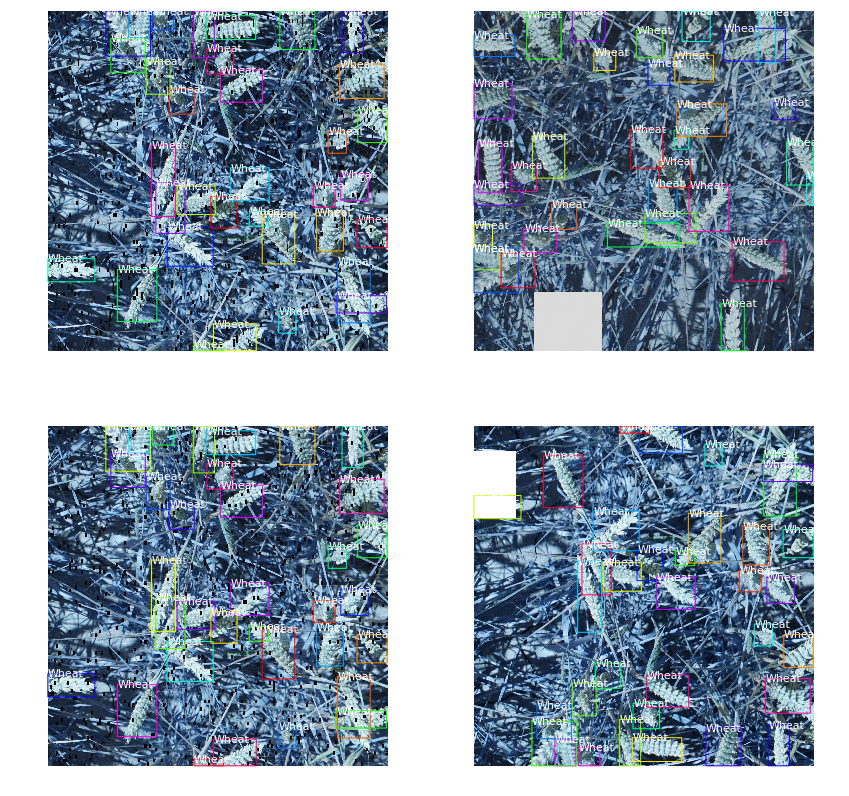

In [23]:
# from official repo
def get_ax(rows=1, cols=1, size=7):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


limit = 4
ax = get_ax(rows=2, cols=limit//2)

for i in range(limit):
    image, image_meta, class_ids,\
    bbox, mask = modellib.load_image_gt(
        dataset_train, config, image_id, use_mini_mask=False, 
        augment=False, augmentation=augmentation)
    
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset_train.class_names, ax=ax[i//2, i % 2],
                                show_mask=False, show_bbox=False)

In [24]:
def model_definition():
    print("loading mask R-CNN model")
    model = modellib.MaskRCNN(mode='training', 
                              config=config, 
                              model_dir=packages_root)
    

    model.load_weights(data_root + '/cocowg/mask_rcnn_coco.h5',
                       by_name=True, 
                       exclude=["mrcnn_class_logits",
                                "mrcnn_bbox_fc",  
                                "mrcnn_bbox","mrcnn_mask"])
    return model   

model = model_definition()

loading mask R-CNN model


In [26]:
from keras.callbacks import (ModelCheckpoint, ReduceLROnPlateau, CSVLogger)

def callback():
    cb = []
    checkpoint = ModelCheckpoint(packages_root+'wheat_wg.h5',
                                 save_best_only=True,
                                 mode='min',
                                 monitor='val_loss',
                                 save_weights_only=True, verbose=1)
    cb.append(checkpoint)
    reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss',
                                   factor=0.3, patience=5,
                                   verbose=1, mode='auto',
                                   epsilon=0.0001, cooldown=1, min_lr=0.00001)
    log = CSVLogger(packages_root+'wheat_history.csv')
    cb.append(log)
    cb.append(reduceLROnPlat)
    return cb

In [27]:
%%time
CB = callback()
TRAIN = False

class WheatInferenceConfig(WheatDetectorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

if TRAIN:
    model.train(dataset_train, dataset_valid, 
                augmentation=augmentation, 
                learning_rate=config.LEARNING_RATE,
                custom_callbacks = CB,
                epochs=epoch, layers='all') 
else:
    inference_config = WheatInferenceConfig()
    model = modellib.MaskRCNN(mode='inference', 
                              config=inference_config,
                              model_dir=packages_root)
    
    model.load_weights(data_root + '/096269-wheat-r101/wheat_096269_101_1024.h5', 
                       by_name = True)

CPU times: user 10.5 s, sys: 298 ms, total: 10.8 s
Wall time: 10.9 s


In [28]:
history = pd.read_csv(data_root + '/wheatweight/wheat_history.csv') 


print(history.loc[history['val_loss'].idxmin()])
history.head()

epoch                   77.000000
loss                     1.097748
mrcnn_bbox_loss          0.232579
mrcnn_class_loss         0.271902
mrcnn_mask_loss          0.299718
rpn_bbox_loss            0.248904
rpn_class_loss           0.044611
val_loss                 1.016543
val_mrcnn_bbox_loss      0.225225
val_mrcnn_class_loss     0.246011
val_mrcnn_mask_loss      0.293907
val_rpn_bbox_loss        0.205175
val_rpn_class_loss       0.046190
Name: 77, dtype: float64


,epoch,loss,mrcnn_bbox_loss,mrcnn_class_loss,mrcnn_mask_loss,rpn_bbox_loss,rpn_class_loss,val_loss,val_mrcnn_bbox_loss,val_mrcnn_class_loss,val_mrcnn_mask_loss,val_rpn_bbox_loss,val_rpn_class_loss
0,0,1.793012,0.396198,0.400109,0.431264,0.429807,0.135600,1.610578,0.309193,0.331686,0.333010,0.482381,0.154273
1,1,1.301321,0.274120,0.328374,0.336091,0.299777,0.062925,1.419602,0.278529,0.364511,0.311159,0.347890,0.117479
2,2,1.216575,0.257206,0.307851,0.323561,0.280012,0.047911,1.360175,0.291734,0.368800,0.320734,0.282121,0.096751
3,3,1.160110,0.240599,0.299956,0.316172,0.254732,0.048616,1.447964,0.306521,0.394653,0.325209,0.311028,0.110518
4,4,1.104426,0.229990,0.283899,0.310955,0.239217,0.040332,1.476106,0.316820,0.378452,0.324366,0.342224,0.114210


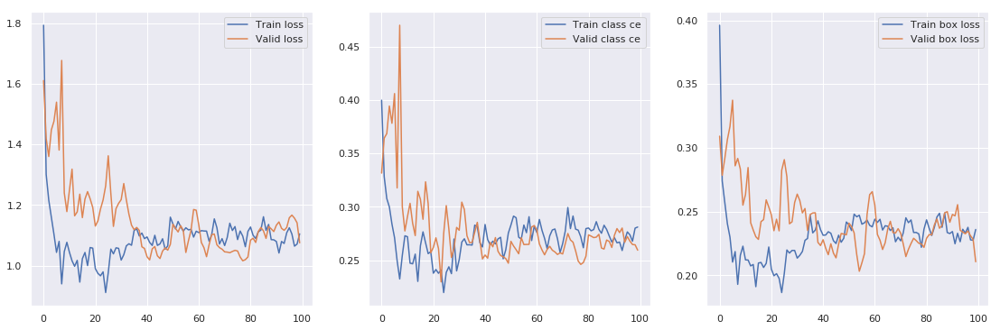

In [29]:
plt.figure(figsize=(19,6))

plt.subplot(131)
plt.plot(history.epoch, history.loss, label="Train loss")
plt.plot(history.epoch, history.val_loss, label="Valid loss")
plt.legend()

plt.subplot(132)
plt.plot(history.epoch, history.mrcnn_class_loss, label="Train class ce")
plt.plot(history.epoch, history.val_mrcnn_class_loss, label="Valid class ce")
plt.legend()

plt.subplot(133)
plt.plot(history.epoch, history.mrcnn_bbox_loss, label="Train box loss")
plt.plot(history.epoch, history.val_mrcnn_bbox_loss, label="Valid box loss")
plt.legend()

plt.show()

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261120, 4)        min:   -0.08847  max:    1.05719  float32
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  int64
gt_class_id              shape: (30,)                 min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (30, 4)               min:    0.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 30)      min:    0.00000  max:    1.00000  bool
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas    

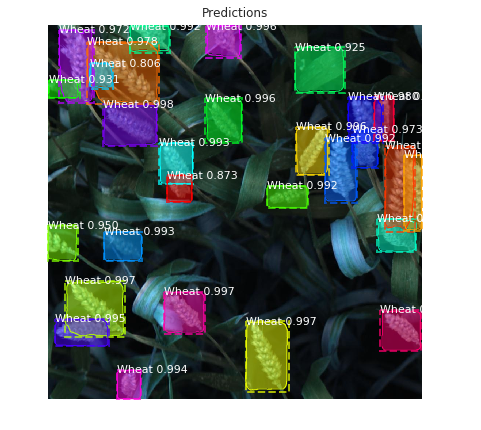

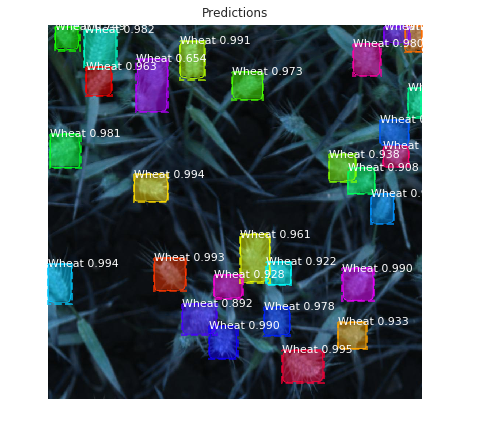

In [30]:
image_id = np.random.choice(dataset_valid.image_ids, 2)

for img_id in image_id:
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_valid, inference_config,     
                               img_id, use_mini_mask=False)

    info = dataset_valid.image_info[img_id]
    results = model.detect([original_image], verbose=1)
    r = results[0]

    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_valid.class_names, r['scores'], ax=get_ax(), title="Predictions")
    
    log("image_meta", image_meta)
    log("gt_class_id", gt_class_id)
    log("gt_bbox", gt_bbox)
    log("gt_mask", gt_mask)

In [31]:
%%time

thresh_score = [0.5 , 0.55, 0.6 , 0.65, 0.7 , 0.75]

def evaluate_threshold_range(test_set, image_ids, model, 
                             iou_thresholds, inference_config):

    AP = []
    np.seterr(divide='ignore', invalid='ignore') 
    
    for image_id in image_ids
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(test_set, inference_config,
                                   image_id, use_mini_mask=False)

        results = model.detect([image], verbose=0)
        r = results[0]
        AP_range = utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask, 
                                          r["rois"], r["class_ids"], r["scores"], r['masks'],
                                          iou_thresholds=iou_thresholds, verbose=0)
        
        if math.isnan(AP_range):
            continue
            
        AP.append(AP_range)   
        
    return AP

AP = evaluate_threshold_range(dataset_valid, dataset_valid.image_ids,
                              model, thresh_score, inference_config)

print("AP[0.5:0.75]: ", np.mean(AP))

AP[0.5:0.75]:  0.6567920487942014
CPU times: user 57min 48s, sys: 11min 48s, total: 1h 9min 37s
Wall time: 58min 41s


In [32]:
def get_jpg(img_dir):
    jpg_fps = glob.glob(img_dir + '*.jpg')
    return list(set(jpg_fps))

test_img_root  = data_root + '/global-wheat-detection/test/'
test_image_fps = get_jpg(test_img_root)

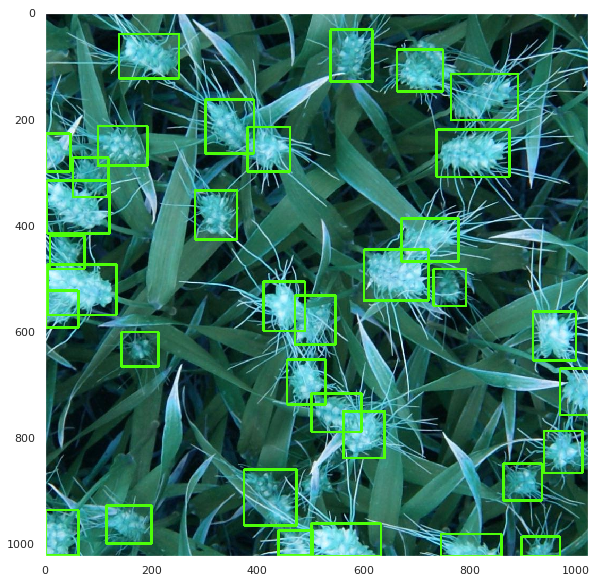

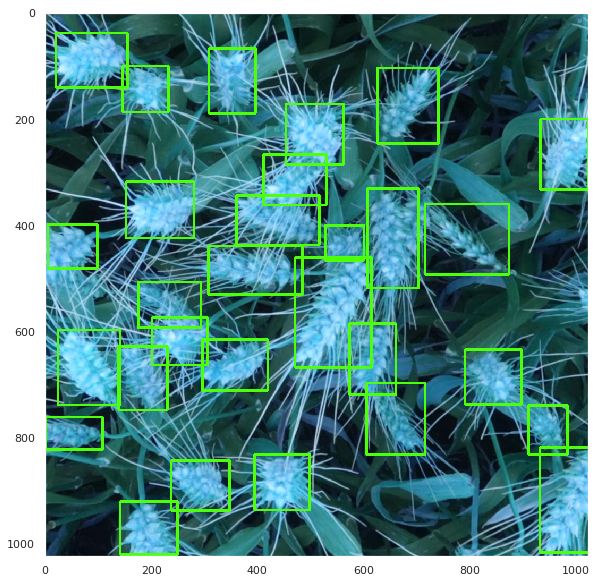

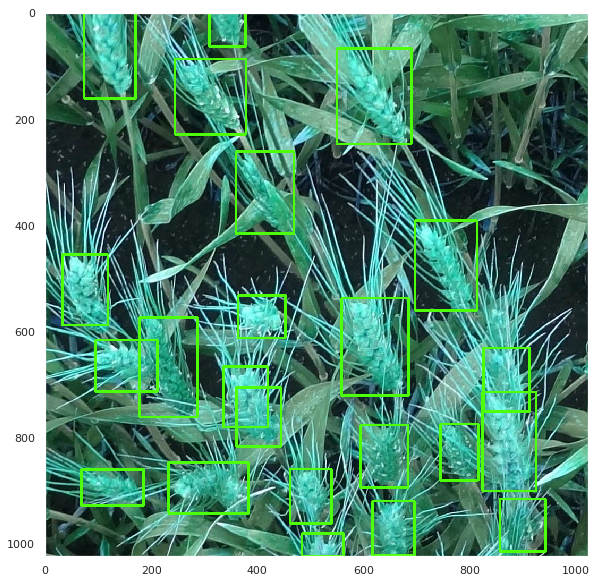

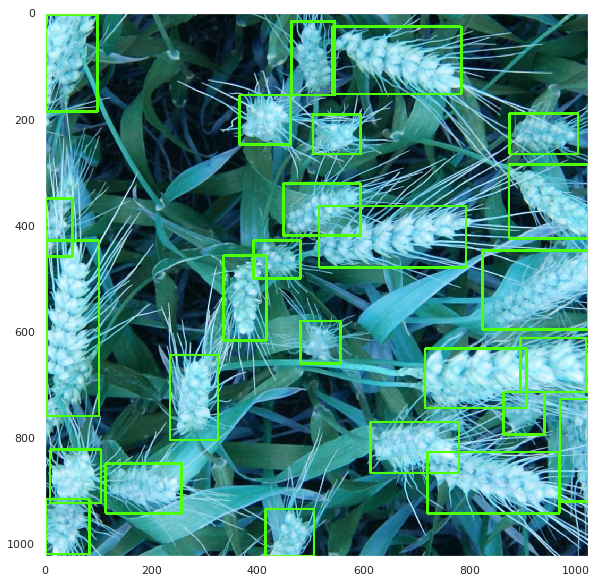

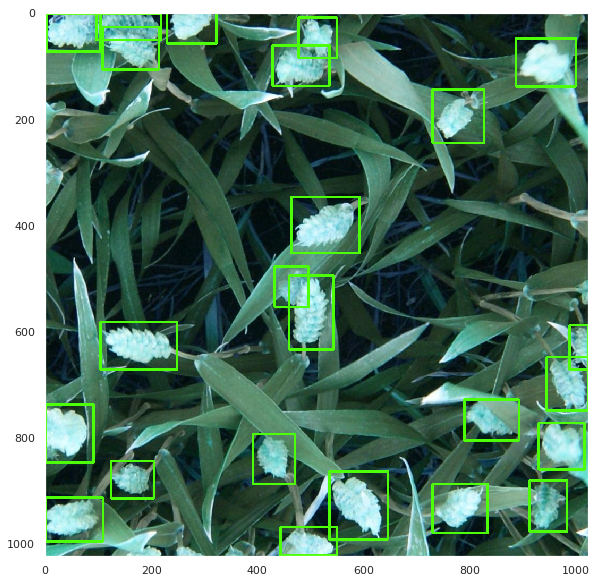

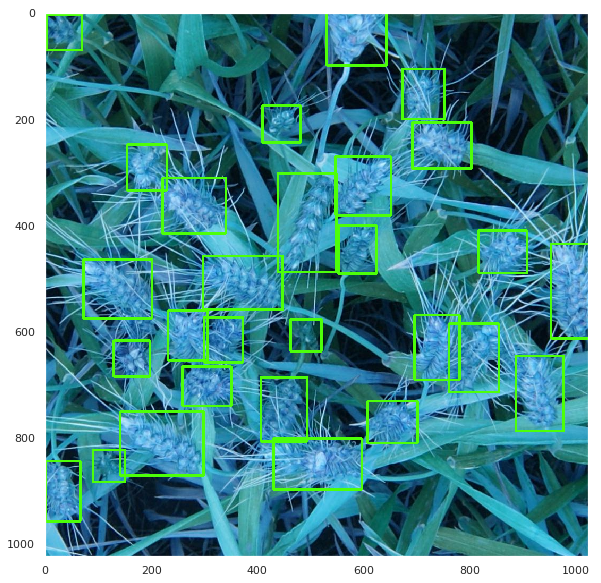

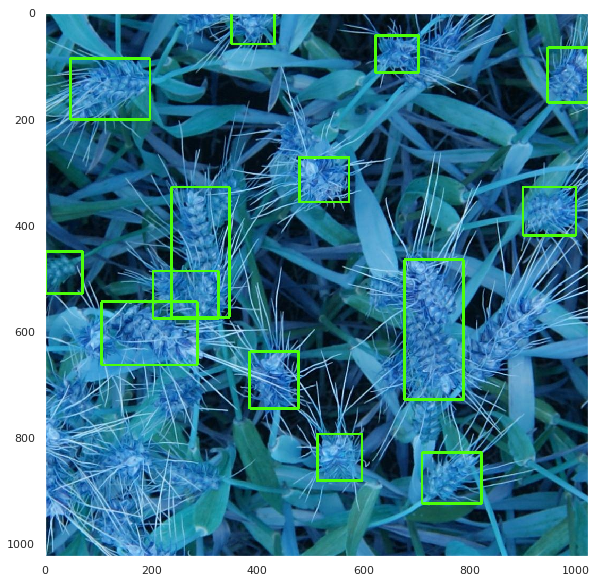

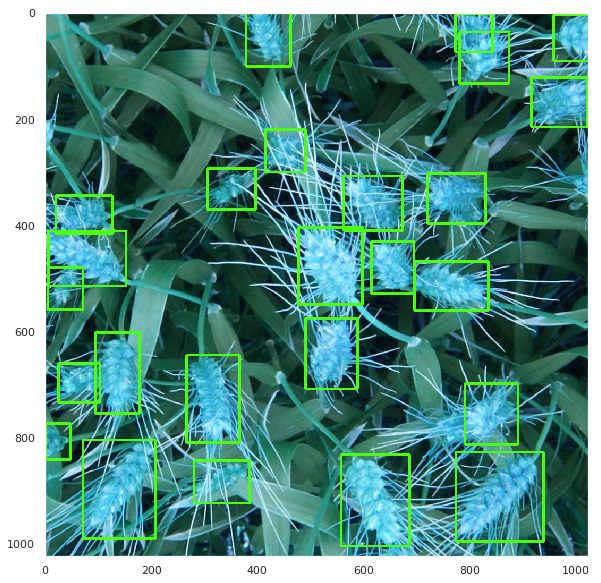

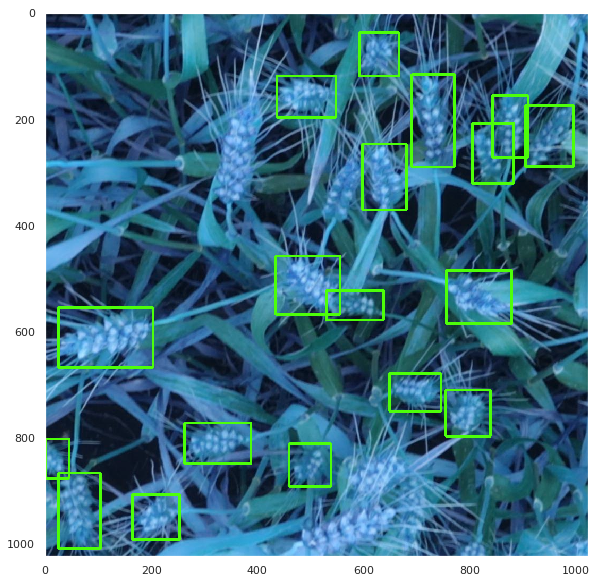

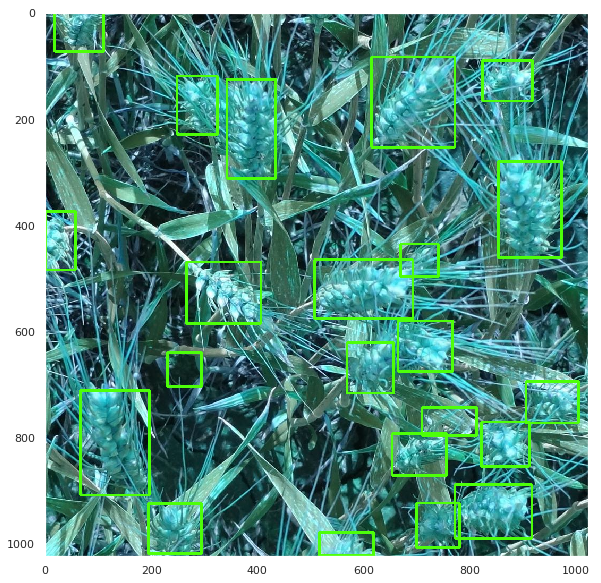

In [33]:
for image_id in test_image_fps:
    image = cv2.imread(image_id, cv2.IMREAD_COLOR)

    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]

    if len(image.shape) != 3 or image.shape[2] != 3:
        image = np.stack((image,) * 3, -1) 

    resized_image, window, scale, padding, crop = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        min_scale=config.IMAGE_MIN_SCALE,
        max_dim=config.IMAGE_MAX_DIM,
        mode=config.IMAGE_RESIZE_MODE)

    image_id = os.path.splitext(os.path.basename(image_id))[0]

    results = model.detect([resized_image])
    r = results[0]
    for bbox in r['rois']: 
        x1 = int(bbox[1] * resize_factor)
        y1 = int(bbox[0] * resize_factor)
        x2 = int(bbox[3] * resize_factor)
        y2 = int(bbox[2] * resize_factor)
        cv2.rectangle(image, (x1,y1), (x2,y2), (77, 255, 9), 3, 1)
        width  = x2 - x1 
        height = y2 - y1 

    plt.figure(figsize=(10,10)) 
    plt.grid(False)
    plt.imshow(image, cmap=plt.cm.gist_gray)

In [34]:
def predict(image_fps, filepath='submission.csv', min_conf=0.50):
    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]

    with open(filepath, 'w') as file:
        file.write("image_id,PredictionString\n")

        for image_id in tqdm(image_fps):
            image = cv2.imread(image_id, cv2.IMREAD_COLOR)

            if len(image.shape) != 3 or image.shape[2] != 3:
                image = np.stack((image,) * 3, -1)
                
            image, window, scale, padding, crop = utils.resize_image(
                image,
                min_dim=config.IMAGE_MIN_DIM,
                min_scale=config.IMAGE_MIN_SCALE,
                max_dim=config.IMAGE_MAX_DIM,
                mode=config.IMAGE_RESIZE_MODE)

            image_id = os.path.splitext(os.path.basename(image_id))[0]

            results = model.detect([image])
            r = results[0]

            out_str = ""
            out_str += image_id
            out_str += ","
            
            assert( len(r['rois']) == len(r['class_ids']) == len(r['scores']) )
            
            if len(r['rois']) == 0:
                pass
            else:
                num_instances = len(r['rois'])
                for i in range(num_instances):
                    if r['scores'][i] > min_conf:
                               
                        out_str += ' '
                        out_str += "{0:.4f}".format(r['scores'][i])
                        out_str += ' '

                        # x1, y1, width, height
                        x1 = r['rois'][i][1]
                        y1 = r['rois'][i][0]
                        width = r['rois'][i][3] - x1
                        height = r['rois'][i][2] - y1
                        bboxes_str = "{} {} {} {}".format( x1*resize_factor, y1*resize_factor, \
                                                           width*resize_factor, height*resize_factor )
                        out_str += bboxes_str

            file.write(out_str+"\n")

In [35]:
submission = os.path.join(packages_root, 'submission.csv')
predict(test_image_fps, filepath=submission)

100%|██████████| 10/10 [00:03<00:00,  3.32it/s]


In [36]:
submit = pd.read_csv(submission)
submit.head(10)

,image_id,PredictionString
0,348a992bb,0.9935 737.0 221.0 137.0 89.0 0.9934 282.0 33...
1,53f253011,0.9944 625.0 105.0 115.0 142.0 0.9907 20.0 39...
2,aac893a91,0.9944 73.0 1.0 97.0 161.0 0.9939 616.0 920.0...
3,51b3e36ab,0.9932 235.0 645.0 90.0 160.0 0.9921 540.0 27...
4,2fd875eaa,0.9974 104.0 583.0 144.0 90.0 0.9966 391.0 79...
5,f5a1f0358,0.9916 0.0 845.0 66.0 113.0 0.9857 154.0 249....
6,796707dd7,0.9832 0.0 450.0 70.0 80.0 0.9825 899.0 329.0...
7,cc3532ff6,0.9966 773.0 828.0 165.0 168.0 0.9942 378.0 0...
8,cb8d261a3,0.9830 25.0 556.0 178.0 113.0 0.9797 648.0 68...
9,51f1be19e,0.9903 614.0 84.0 157.0 170.0 0.9745 771.0 88...
